# Trabajemos con imágenes

En estas sesiones vamos a trabajar con las librerías:
- PIL
- numpy
- sympy

Y nuestro objetivo será manejar imágenes.

Si la instalación de Python es minimal es posible que alguna de estas librerías no estén instaladas. Comenzamos importando las funciones de estas librerías que nos interesan, si nos aparece algún error del tipo "Pill no está instalado" ejecutamos las líneas siguientes.

In [13]:
!pip3 install pillow --user
!pip3 install numpy --user
# reiniciar núcleo

In [14]:
from PIL import Image
from numpy import *
from sympy import *

In [15]:
import numpy as np

**Formatos de las imágenes:** png, jpg,jpeg, gif ... 

Abramos algunas imágenes.

Primero la cargamos

In [16]:
eva=Image.open('eva.jpg')

Y para mostrarla sólo hay que llamarla

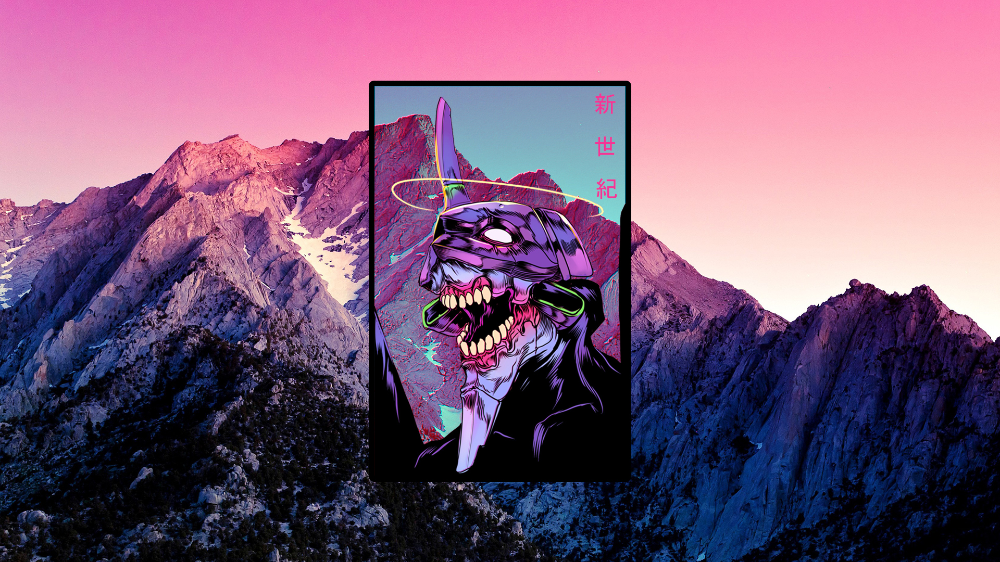

In [17]:
eva

Con el comando size podemos ver las dimensiones de estas imágenes

In [18]:
eva.size

(1920, 1080)

Para trabajar con estas imágenes las transformaremos en algún tipo de dato matemático, en este caso en matrices.

In [19]:
mcv=eva.load()

In [20]:
type(mcv)

PixelAccess

Veamos que tipo de dato tienen estas matrices como entrada

In [21]:
mcv[0,0]

(230, 113, 191)

Cada entrada es una terna cuyas coordenadas indican los niveles de Rojo, Verde y Azul (RGB) que tiene la imagen en ese punto. Algunas matrices asociadas a imágenes tienen como entradas cuaternas (en lugar de ternas) en estás el último dígito indica el nivel de transparencia.

Podemos cambiar el aspecto de la imagen simplemente cambiando los puntos de su matriz.

In [22]:
for i in range(eva.size[0]):
    for j in range(45):
        mcv[i,j]=(0,0,0)

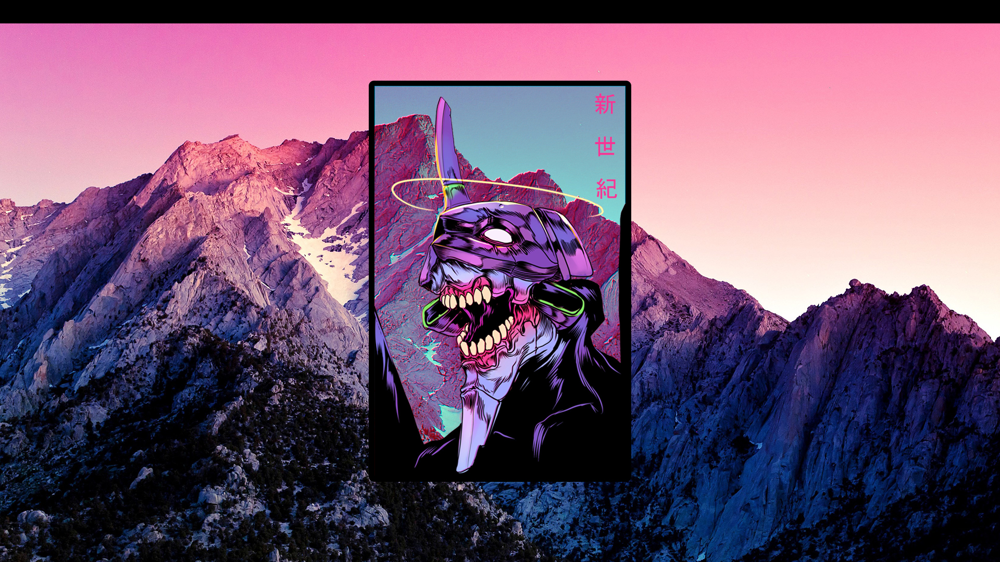

In [23]:
eva

Si la imagen es muy grande, podemos cambiar su tamaño

In [24]:
(n,m)=eva.size

In [25]:
eva_res = eva.resize((int(n/2),int(m/2)), Image.LANCZOS)

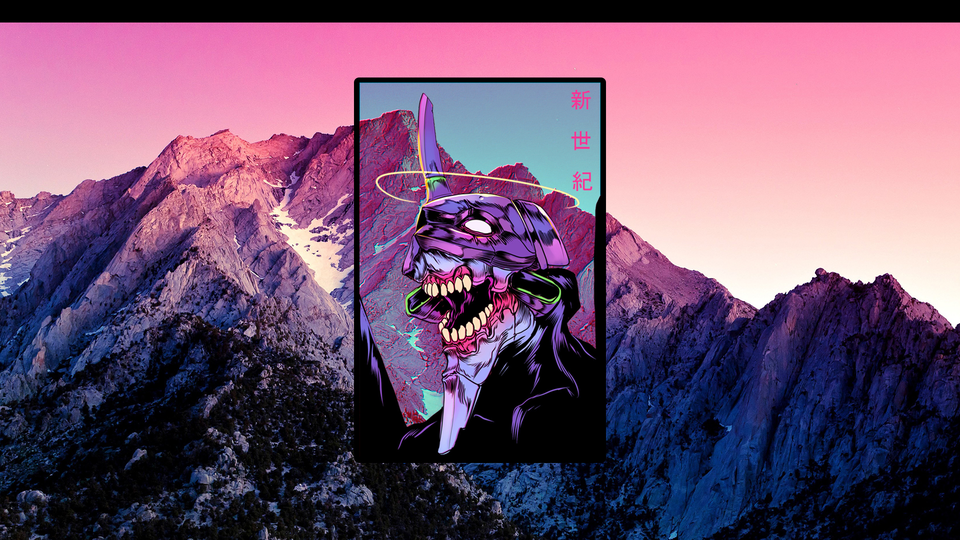

In [26]:
eva_res

¡¡Cuidado!! cuando hacemos cambios en la imagen o en la matriz de la imagen perdemos la imagen de partida y esto a veces no queremos que pase. Por eso normalmente haremos una copia de la imagen y en la copia haremos los cambios.

In [27]:
eva = Image.open('eva.jpg')
eva_matrix = cv.load()

In [28]:
(n,m) = eva.size

In [29]:
eva_copy = eva.copy()
eva_red = eva_copy.resize((int(n/5),int(m/5)), Image.LANCZOS)

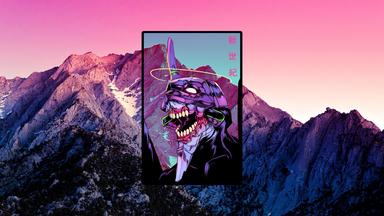

In [30]:
eva_red

La siguiente función me permite calcular el negativo de una imagen. Notar que los valores r,g,b son datos módulo 256 

In [31]:
def negativo(im):
    imaux=im.copy()
    maux= imaux.load()
    (n,m)= imaux.size
    for i in range(n):
        for j in range(m):
            maux[i,j]=tuple([255-t for t in maux[i,j]])
    return(imaux)

In [32]:
eva_neg = negativo(eva)

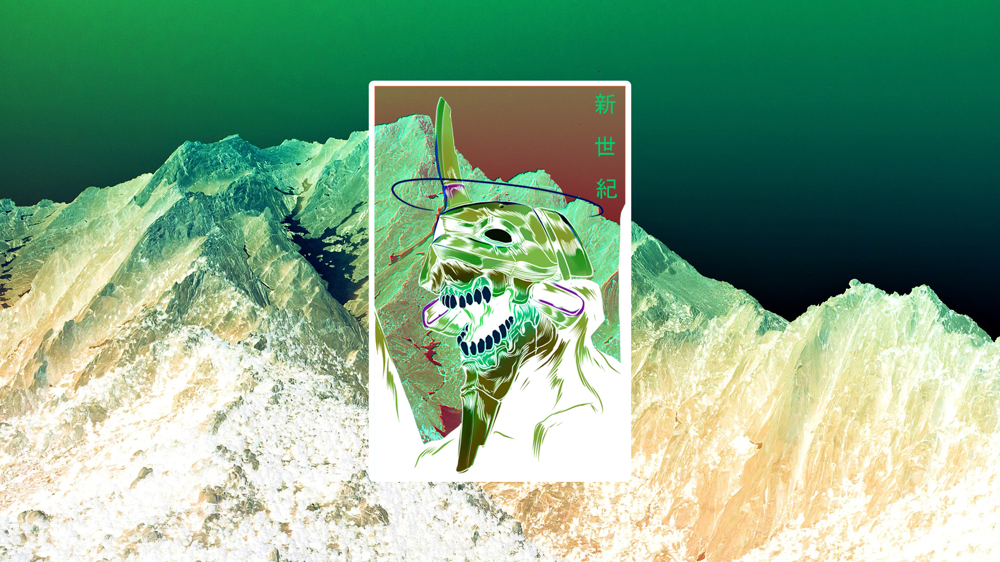

In [33]:
eva_neg

Puedo guardar la imágenes, incluso cambiando el formato

In [34]:
eva_neg.save('eva_neg.jpg')

In [35]:
eva_neg.save('eva_neg.png','PNG')

# Ejercicio 1

Define una función <span style="color:blue">flip</span> que transforme una imagen en otra obtenida aplicandole una simetría a los puntos de la imagen respecto de una línea vertical que pase por el centro.

<span style="color:red">__Cuando definamos una función para tratar imágenes dentro de la definición hacemos una copia de la imagen y tratamos esta copia.__</span>

In [38]:
def flip(imagen):
    img_temp = imagen.copy()
    m_img_orig = imagen.load()
    m_img = img_temp.load()
    n,m = img_temp.size
    # n_med,m_med = int(n/2),int(m/2)
    for i in range(n):
        for j in range(m):
            m_img[i,j] = m_img_orig[n-i-1,j]
    return img_temp

In [39]:
eva_flipped = flip(eva)

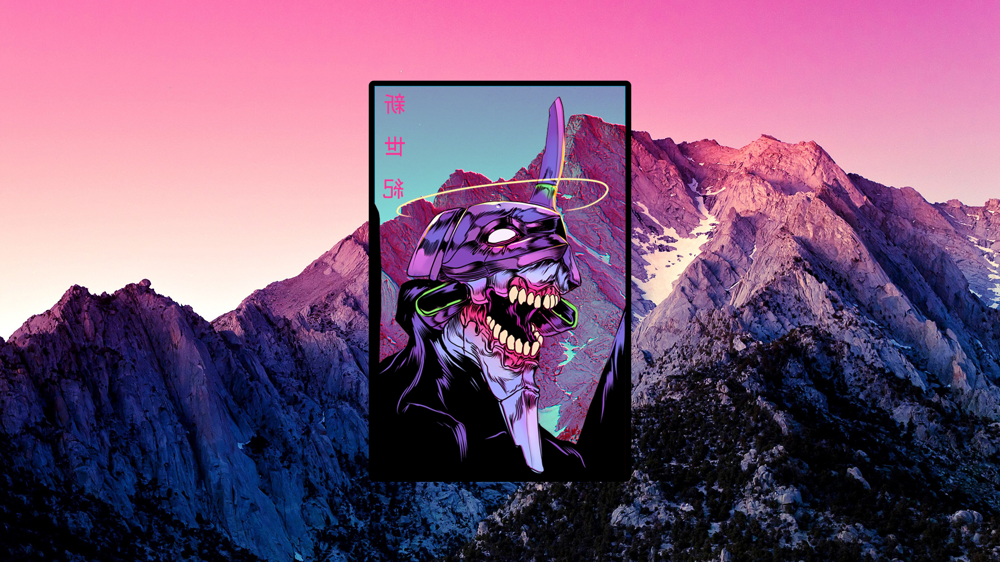

In [40]:
eva_flipped